# Train a JointVAE model

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import torch

use_cuda = torch.cuda.is_available()
use_cuda

True

In [3]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"  # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"] = "1"  # change to your device

### Load The Shoe Data

In [4]:
!ls /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/

0  8			      archive2_2.tar.bz2  da.tar.bz2
1  9			      archive2_3.tar.bz2  mltmp.tar.bz2
2  anchor_positive_data.json  archive2_4.tar.bz2  __pycache__
3  archive1_5.tar.bz2	      archive2_5.tar.bz2  rayimages2_cleaned.h5
4  archive1_8.tar.bz2	      archive6.tar.bz2	  rayimages2.h5
5  archive1_9.tar.bz2	      archive7.tar.bz2	  README.txt
6  archive2_0.tar.bz2	      clean_data.pkl	  selectMetaData9.sql
7  archive2_1.tar.bz2	      data_loader.py


In [5]:
import pandas as pd
metadata = pd.read_hdf("/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/rayimages2_cleaned.h5")

In [6]:
metadata.head(3)

,PRODUCT_ID,PRODUCT_COLORWAY_ID,COLORWAY_IMAGE_ROLE_TYPE,IMAGE_ID,PRODUCT_TYPE,SIZE_RANGE,GENDER
IMAGE_FILE,,,,,,,
2/8/2878730_3748135.jpg,2878730,2464687,CPRI,3748135,BEAUTY_TOOL,Regular,Unisex
2/8/2878730_3783475.jpg,2878730,2464687,CADD,3783475,BEAUTY_TOOL,Regular,Unisex
1/5/1506322_2880153.jpg,1506322,1416673,CPRI,2880153,APPAREL,Regular,Men


In [7]:
#np.unique(metadata['PRODUCT_TYPE'])

In [8]:
shoe_types = ['SHOE', 'BOAT_SHOE', 'OXFORDS', 'PUMP', 'SLIPPER', 'SNEAKER', 'SANDAL']

In [9]:
shoe_df = metadata.query("PRODUCT_TYPE in ['SHOE', 'BOAT_SHOE', 'OXFORDS', 'PUMP', 'SLIPPER', 'SNEAKER', 'SANDAL']")

In [10]:
shoe_df.PRODUCT_TYPE.unique()

array(['SHOE', 'SNEAKER', 'SANDAL', 'SLIPPER', 'PUMP', 'OXFORDS',
       'BOAT_SHOE'], dtype=object)

In [11]:
shoe_df['PRODUCT_TYPE'].value_counts()

SHOE         384261
SANDAL        76526
SNEAKER       41403
PUMP          36571
OXFORDS        5411
SLIPPER        2185
BOAT_SHOE      1702
Name: PRODUCT_TYPE, dtype: int64

In [12]:
image_dir = '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/'
shoe_paths = [image_dir + str(x) for x in shoe_df.index]
shoe_paths[:5]

['/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/8/5860413_9882517.jpg',
 '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/8/5814376_9882308.jpg',
 '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/8/5814376_9882313.jpg',
 '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/5/6571113_9877407.jpg',
 '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/5/6571113_9877409.jpg']

In [13]:
from random import shuffle
shuffle(shoe_paths)
shoe_paths[:5]

['/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/7/6797434_9340286.jpg',
 '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/4/640878_988022.jpg',
 '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/4/3/4365329_8119993.jpg',
 '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/8/2857145_3640625.jpg',
 '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/5/1531339_2081589.jpg']

In [14]:
len(shoe_paths)

548059

# TODO: Set up logging to automate this process

In [ ]:
bad_data = [
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/2/1230829_1895083.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777994_1427442.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2751336_1336221.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753697_1364807.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363405.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/4/740051_1331707.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363403.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364780.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777993_1427435.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769639_1399528.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791665_1469695.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363397.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/772960_1416876.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798045_1469808.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/751112_1359521.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769585_1399069.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/774841_1417904.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438452.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985868_1336221.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461436.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/5/858397_1364774.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1376460_1461991.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469680.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/766080_1394360.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469682.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461437.jpg',
    '/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364782.jpg',
]

In [38]:
for pth in shoe_paths:
    if pth in bad_data:
        del shoe_paths[shoe_paths.index(pth)]
print(len(shoe_paths))

548036


In [40]:
image_paths_train = shoe_paths[:470000]
image_paths_test = shoe_paths[470000:-36]

print(f"Number of train image paths: {len(image_paths_train):,d}")
print(f"Number of test image paths: {len(image_paths_test):,d}")
print()
print("Sample paths:")
print(image_paths_train[0])
print(image_paths_train[-1])
print(image_paths_test[0])
print(image_paths_test[-1])

Number of train image paths: 470,000
Number of test image paths: 78,000

Sample paths:
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/7/6797434_9340286.jpg
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/6/5648412_9593846.jpg
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/0/703087_1277172.jpg
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/4/8/4891195_8810215.jpg


### Create data loaders

In [41]:
from torchvision import transforms
from utils.dataloader_tools import get_imagelist_dataloader, ImageListDataset

BATCH_SIZE = 500

composed = transforms.Compose([transforms.CenterCrop((256,256)),transforms.Resize((256,256)),transforms.ToTensor()])

# convert rgb is for the cv2 loaded images that I've got in this dir
train_dataset = ImageListDataset(image_paths_train, cut_from='top', cut_amount=256, transform=composed, 
                                 convert_rgb=False, error_handling=True)
test_dataset = ImageListDataset(image_paths_test, cut_from='top', cut_amount=256, transform=composed, 
                                convert_rgb=False, error_handling=True)

train_loader = get_imagelist_dataloader(batch_size=BATCH_SIZE, dataset_object=train_dataset)
test_loader = get_imagelist_dataloader(batch_size=BATCH_SIZE, dataset_object=test_dataset)

### Define latent distribution of the model

In [42]:
# Latent distribution will be joint distribution of 10 gaussian normal distributions
# and one 10 dimensional Gumbel Softmax distribution
latent_spec = {'cont': 20, 'disc': [10, 10, 10]}

### Build a model

In [43]:
from jointvae.models_256_convjump2bn import VAE

model = VAE(latent_spec=latent_spec, hidden_dim=512, img_size=(3, 256, 256), use_cuda=use_cuda)

In [44]:
#print(model)

### Train the model

In [45]:
from torch import optim

# Build optimizer
optimizer = optim.Adam(model.parameters(), lr=8e-4, amsgrad=True) # added amsgrad # orig lr 5e-4

In [46]:
from jointvae.training import Trainer
#from jointvae.training_debug import Trainer

# Define the capacities
# Continuous channels
cont_capacity = [0.0, 6, 35000, 36.0]  # Starting at a capacity of 0.0, increase this to 5.0
                                         # over 25000 iterations with a gamma of 30.0
# Discrete channels
disc_capacity = [0.0, 6, 35000, 36.0]  # Starting at a capacity of 0.0, increase this to 5.0
                                         # over 25000 iterations with a gamma of 30.0

# Build a trainer
trainer = Trainer(model, optimizer,
                  cont_capacity=cont_capacity,
                  disc_capacity=disc_capacity,
                 use_cuda=use_cuda)

#### Initialize visualizer

In [47]:
#from viz.visualize import Visualizer
from viz.visualize import Visualizer

viz = Visualizer(model)
viz.save_images = False # needed to add this so it returns a tensor

In [48]:
# Note this should be at least 100 epochs for proper training or more but can be less to demo

trainer.train(train_loader, epochs=175, save_training_gif=None)

0/470000	Loss: 45427.551
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438452.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985868_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/5/858397_1364774.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1376460_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469680.jpg does not have 3 chan

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461435.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/799464_1468942.jpg does not have 3 channels
Replacing with previous image
200000/470000	Loss: 14664.345
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777993_1427436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401869.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_1336221.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401868.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469683.jpg does not have 3 channels
Replacing with previous image
Epoch: 1 Average loss: 16705.75
0/470000	Loss: 14123.538
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798046_1469792.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427453.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
200000/470000	Loss: 13624.195
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769585_1399068.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363409.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769983_1401914.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/2/1230808_1894813.jpg does not have 3 channels
Replacing with previous image
450000/470000	Loss: 13538.192
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364773.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777993_1427436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/799464_1468942.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/779190_1451050.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401868.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438455.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462003.jpg does not have 3 channels
Replacing with previous image
200000/470000	Loss: 13441.469
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363409.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461435.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780525_1365250.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363417.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/775985_1429262.jpg does not have 3 channels
Replacing with previous image
425000/470000	Loss: 13361.343
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469680.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462001.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/2/1230808_1894813.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/695659_1427506.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427452.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777994_1427441.jpg does not have 3 channels
Replacing with previous image
200000/470000	Loss: 13294.493
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/698058_1384839.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/4/747953_1351254.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469682.jpg does not have 3 channels
Replacing with previous image
400000/470000	Loss: 13357.525
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769983_1401914.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469683.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401868.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/784292_1444176.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1401921.jpg does not have 3 channels
Replacing with previous image
150000/470000	Loss: 13196.389
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/1/812996_1331707.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753700_1364821.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/3/835585_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780525_1365250.jpg does not have 3 channels
Replacing with previous image
375000/470000	Loss: 13264.792
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364782.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780533_1384839.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364774.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461436.jpg does not have 3 channels
Replacing with previo

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462002.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461435.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364773.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
375000/470000	Loss: 13128.627
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461437.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769983_1401914.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985868_1336221.jpg does not have 3 channels
Replacing with previous image
100000/470000	Loss: 13136.741
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/9/295482_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462003.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/2/1230808_1894813.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/5/858397_1364774.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438454.jpg does not have 3 channels
Replacing with previous image
350000/470000	Loss: 13160.680
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/3/835585_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777993_1427436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/2/1230778_1894683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/4/747952_1351249.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461437.jpg does not have 3 channels
Replacing with previous image
100000/470000	Loss: 12978.445
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427452.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462003.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753700_1364823.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438452.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798046_1469792.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/772960_1416875.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/1/714370_1399119.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364782.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/2/1230808_1894813.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
325000/470000	Loss: 13059.337
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777994_1427441.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/772391_1410997.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461436.jpg does not have 3 channels
Replacing with previous image
75000/470000	Loss: 13020.042
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/775985_1429262.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/784292_1444176.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461435.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777900_1428744.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/768641_1428386.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985868_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/4/747952_1351249.jpg does not have 3 channels
Replacing with previou

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438455.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/2/1230778_1894683.jpg does not have 3 channels
Replacing with previous image
75000/470000	Loss: 13018.692
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/5/858397_1364773.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/799464_1468942.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363417.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/768641_1428386.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461437.jpg does not have 3 channels
Replacing with previous image
300000/470000	Loss: 12977.351
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364783.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427452.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461437.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1058184_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/773083_1420891.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364774.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
50000/470000	Loss: 12986.863
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2751336_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438455.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1376460_1461991.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462003.jpg does not have 3 channels
Replacing with previous image
300000/470000	Loss: 12922.448
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753700_1364821.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985868_1336221.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
25000/470000	Loss: 12943.311
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769985_1401928.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461435.jpg does not have 3 channels
Replacing with previous image
50000/470000	Loss: 12981.883
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/775985_1429262.jpg does not have 3 channels
Replacing with previous image
225000/470000	Loss: 12876.346
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985868_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/784292_1444176.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/2/1230808_1894813.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/695659_1427506.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798043_1469808.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1058184_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1365642_1446011.jpg does not have 3 channels
Replacing with previous image
25000/470000	Loss: 12948.219
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401869.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793850_1463528.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769585_1399068.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/4/747953_1351254.jpg does not have 3 channels
Replacing with previous image
275000/470000	Loss: 12905.665
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461435.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364774.jpg does not have 3 channels
Replacing with previous image
300000/470000	Loss: 12913.391
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/75369

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427453.jpg does not have 3 channels
Replacing with previous image
Epoch: 13 Average loss: 12913.51
0/470000	Loss: 12973.562
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363417.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/695659_1427506.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427453.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/768641_1428386.jpg does not have 3 channels
Replacing with previous image
225000/470000	Loss: 12911.869
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/750979_1384775.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/698058_1384839.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401869.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985868_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/779190_1451050.jpg does not have 3 channels
Replacing with previous image
450000/470000	Loss: 12866.965
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/1/714370_1399119.jpg does not have 3 c

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1376460_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/3/835585_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798046_1469792.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
275000/470000	Loss: 12858.813
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/784292_1444176.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1376460_1401921.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438452.jpg does not have 3 channels
Replacing with previous image
450000/470000	Loss: 12851.131
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/785954_1451084.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/695659_1427506.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_1336221.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/773083_1420891.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/4/747952_1351249.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 channels
Replacing with previous image
175000/470000	Loss: 12857.292
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/695659_1427506.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462001.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1376460_1401921.jpg does not have 3 channels
Replacing with previous image
425000/470000	Loss: 12806.324
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1365642_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/785954_1451084.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/5/858397_1364774.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/695659_1427506.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363409.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/773083_1420891.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462001.jpg does not have 3 channels
Replacing with previo

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462003.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401868.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/779190_1451050.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461435.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469683.jpg does not have 3 channels
Replacing with previous image
400000/470000	Loss: 12819.502
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/698058_1384839.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401868.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1365642_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469682.jpg does not have 3 channels
Replacing with previous image
175000/470000	Loss: 12818.917
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363417.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777994_1427441.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/9/295482_1336221.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777993_1427436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461435.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363409.jpg does not have 3 channels
Replacing with previous image
400000/470000	Loss: 12814.293
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438454.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/2/1230778_1894683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1058184_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/750979_1384775.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1365642_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1461991.jpg does not have 3 channels
Replacing with previous image
125000/470000	Loss: 12746.581
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/695659_1427506.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364782.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
350000/470000	Loss: 12750.049
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469680.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/785954_1451084.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753700_1364821.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363417.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401868.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/4/747953_1351254.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769585_1399068.jpg does not have 3 channels
Replacing with previous image
125000/470000	Loss: 12726.224
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427452.jpg does not have 3 c

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/773083_1420891.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/5/858397_1364773.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769983_1401916.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462003.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462002.jpg does not have 3 channels
Replacing with previ

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753700_1364823.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438452.jpg does not have 3 channels
Replacing with previous image
100000/470000	Loss: 12677.818
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769585_1399068.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 c

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/3/835585_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363417.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/1/812996_1331707.jpg does not have 3 channels
Replacing with previous image
350000/470000	Loss: 12705.940
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
75000/470000	Loss: 12724.165
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 channels
Replacing with previous image
100000/470000	Loss: 12672.130
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/698058_1384839.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364773.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364774.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363409.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/799464_1468942.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462002.jpg does not have 3 channels
Replacing with previous image
325000/470000	Loss: 12709.333
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438452.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462002.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/773083_1420891.jpg does not have 3 channels
Replacing with previous image
50000/470000	Loss: 12724.965
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427453.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753700_1364821.jpg does not have 3 ch

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461437.jpg does not have 3 channels
Replacing with previous image
275000/470000	Loss: 12715.910
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777900_1428744.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469680.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769985_1401928.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/775985_1429262.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780533_1384839.jpg does not have 3 channels
Replacing with previous image
25000/470000	Loss: 12675.835
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462003.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985868_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/3/835585_1336221.jpg does not have 3 ch

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364774.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469682.jpg does not have 3 channels
Replacing with previous image
250000/470000	Loss: 12644.776
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438454.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1639507_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462001.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469680.jpg does not have 3 channels
Replacing with previous image
Epoch: 24 Average loss: 12657.29
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780533_1384839.jpg does not have 3 channels
Replacing with previous image
0/470000	Loss: 12381.312
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1376460_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1365642_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/75375

225000/470000	Loss: 12627.079
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1639507_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/1/714370_1399119.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363409.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363417.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777994_1427441.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769985_1401928.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798043_1469808.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364783.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/750979_1384775.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469680.jpg does not have 3 channels
Replacing with previous image
Epoch: 25 Average loss: 12642.82
0/470000	Loss: 12852.038
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/1/812996

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363417.jpg does not have 3 channels
Replacing with previous image
225000/470000	Loss: 12584.471
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777900_1428744.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427453.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/9/295482_1336221.jpg does not have 3 channels
Replacing with previous image
250000/470000	Loss: 12627.752
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/513101

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364773.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438455.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/9/295482_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1365642_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
450000/470000	Loss: 12679.288
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/1/812996_1331707.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364774.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777993_1427436.jpg does not have 3 channels
Replacing with previous image
150000/470000	Loss: 12585.425
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438452.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469682.jpg does not have 3

400000/470000	Loss: 12625.928
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/772960_1416875.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753700_1364823.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401869.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/695659_1427506.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461437.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798043_1469808.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363409.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363409.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461437.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1365642_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461436.jpg does not have 3 channels
Replacing with prev

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/5/858397_1364773.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/772391_1410997.jpg does not have 3 channels
Replacing with previous image
375000/470000	Loss: 12584.638
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769585_1399068.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427452.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/766080_1394360.jpg does not have 3 c

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/4/747953_1351254.jpg does not have 3 channels
Replacing with previous image
175000/470000	Loss: 12663.926
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780525_1365250.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363417.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/3/835585_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 

375000/470000	Loss: 12560.711
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/750979_1384775.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/698058_1384839.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798046_1469793.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/1/714370_1399119.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363413.jpg does not have 3 c

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427452.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_1336219.jpg does not have 3 channels
Replacing with previous image
150000/470000	Loss: 12538.730
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/698058_1384839.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753700_1364823.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777997_1427453.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363409.jpg does not have 3 channels
Replacing with previous image
375000/470000	Loss: 12532.677
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/1/812996_1331707.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/779190_1451050.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363409.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/3/835585_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previo

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
350000/470000	Loss: 12525.412
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777994_1427441.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1376460_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/695659_1427506.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798043_1469808.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780384_1438452.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/695659_1427506.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/1/812996_1331707.jpg does not have 3 channels
Replacing with previo

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780525_1365250.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461435.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/799464_1468942.jpg does not have 3 channels
Replacing with previous image
350000/470000	Loss: 12556.731
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401869.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1639507_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753700_1364821.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3 channels
Replacing with previous image
75000/470000	Loss: 12507.888
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780525_1365250.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469680.jpg does not have 3 ch

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/772391_1410997.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/1/1158562_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1639507_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364782.jpg does not have 3 channels
Replacing with previous image
300000/470000	Loss: 12574.677
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/1/812996_1331707.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769985_1401928.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/2/1230808_1894813.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/3/835585_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364783.jpg does not have 3 channels
Replacing with previous image
75000/470000	Loss: 12519.775
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461435.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/790670_1461436.jpg does not have 3 channels
Replacing with previous image
100000/470000	Loss: 12558.623
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/77799

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/4/2440039_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2744495_1461436.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/779190_1451050.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793850_1463528.jpg does not have 3 channels
Replacing with previous image
300000/470000	Loss: 12482.574
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/768641_1428386.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/3/835585_1336219.jpg does not have 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769983_1401914.jpg does not have 3 channels
Replacing with previous image
50000/470000	Loss: 12546.987
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/750979_1384775.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798046_1469793.jpg does not have 3 c

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363417.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753700_1364823.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/4/747953_1351254.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/9/295482_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777900_1428744.jpg does not have 3 channels
Replacing with previo

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/764859_1401868.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/775985_1429262.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/3/835585_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
25000/470000	Loss: 12486.301
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461435.jpg does not have 3 c

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/799464_1468942.jpg does not have 3 channels
Replacing with previous image
250000/470000	Loss: 12489.761
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1376460_1461991.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2751336_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/785954_1451084.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462003.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/766080_1394360.jpg does not have 3 channels
Replacing with previous image
Epoch: 36 Average loss: 12514.81
0/470000	Loss: 12333.671
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/750979_1384775.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/9/8/985912_1469683.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364782.jpg does not have 3 channels
Replacing with previous image
200000/470000	Loss: 12554.507
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/784292_1444176.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363407.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 c

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364783.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/5/1/5131012_1461435.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/775985_1429262.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/8/5/858397_1364773.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1461991.jpg does not have 3 channels
Replacing with previous image
450000/470000	Loss: 12479.569
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/772960_1416875.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753693_1364783.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461435.jpg does not have 3 channels
Replacing with previous image
200000/470000	Loss: 12511.963
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1058184_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/775985_1429262.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769983_1401916.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/798046_1469792.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1639507_1446011.jpg does not have 3 channels
Replacing with previous image
425000/470000	Loss: 12471.527
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/8/1872331_1336221.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363401.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/779190_1451050.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363395.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/1/714370_1399119.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769984_1401921.jpg does not have 3 channels
Replacing with previous image
175000/470000	Loss: 12442.100
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1623718_1461435.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777900_1428744.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753691_1364774.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/777994_1427441.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/7/770392_1404858.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/768641_1428386.jpg does not have 3 channels
Replacing with previous image
400000/470000	Loss: 12489.823
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1096090_1469682.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2751336_1336219.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363411.jpg does not have 3

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



125000/470000	Loss: 12472.962
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/0/1058184_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/3/1376460_1401921.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/799464_1468942.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780533_1384839.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753759_1363415.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/6/769985_1401928.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793850_1463528.jpg does not have 3

file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/753758_1363393.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/5/750979_1384775.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/6/9/698058_1384839.jpg does not have 3 channels
Replacing with previous image
350000/470000	Loss: 12461.859
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/8/780525_1365250.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/791664_1469680.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/1/6/1639507_1446011.jpg does not have 3 channels
Replacing with previous image
file /home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/7/9/793509_1462002.jpg does not have 3 

KeyboardInterrupt: 

In [49]:
print('Done Training')

Done Training


In [50]:
print("Testing system")

Testing system


In [51]:
save_image_path = "sample_images/305/256"
model_name = "cj2_shoes_e54_hdim512_b500_c20d10-10-10_cmax6_35k_gam36"

### Visualize

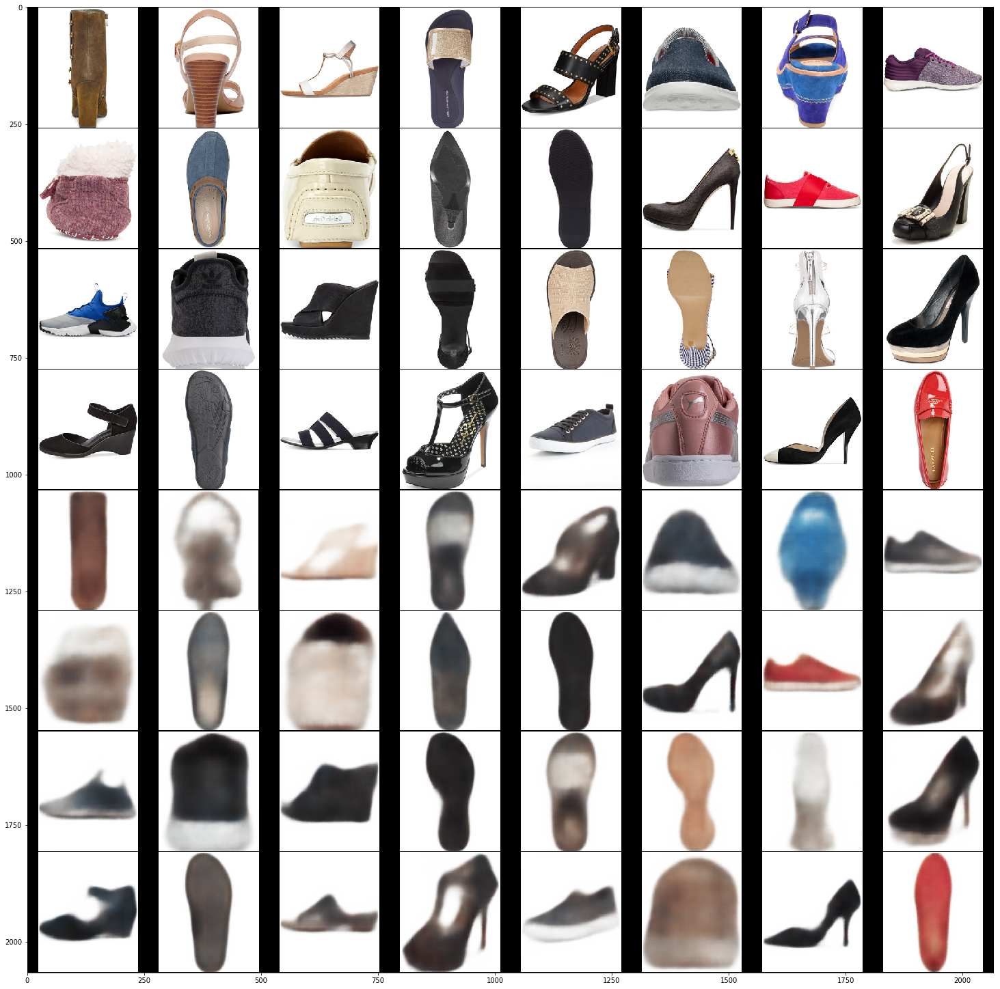

In [52]:
# Plot reconstructions
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Get a batch of data
for batch, labels in test_loader:
    break

# Reconstruct data using Joint-VAE model
recon = viz.reconstructions(batch)

plt.figure(figsize=(26,26))
plt.imshow(np.rot90(np.transpose(recon.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_reconstructions.png",dpi=200)

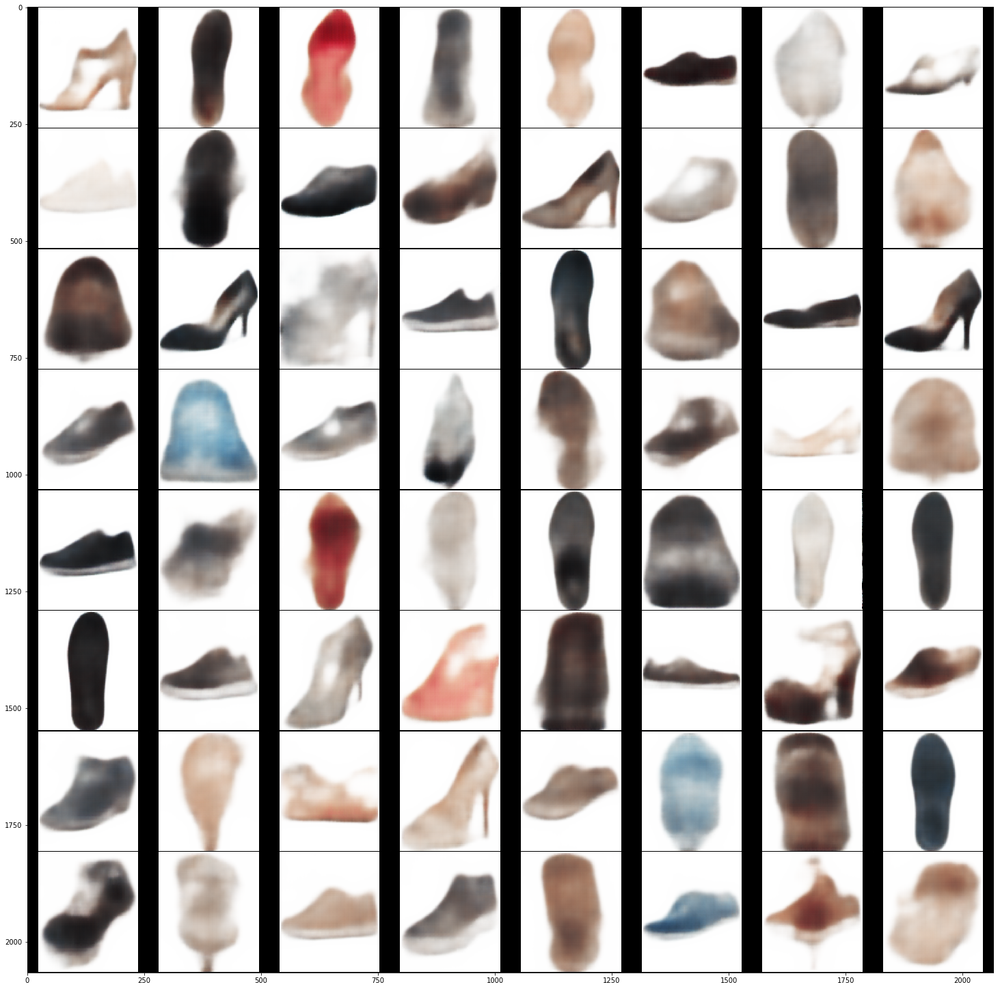

In [53]:
# Plot samples
samples = viz.samples()

plt.figure(figsize=(26,26))
plt.imshow(np.rot90(np.transpose(samples.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_samples.png",dpi=200)

### Note on Traversals

### Traverses all latent dimensions one by one and plots a grid of images where each row corresponds to a latent traversal of one latent dimension
* size: Number of samples for each latent traversal.

In [54]:
print(viz.model.latent_cont_dim, viz.model.num_disc_latents)

20 3


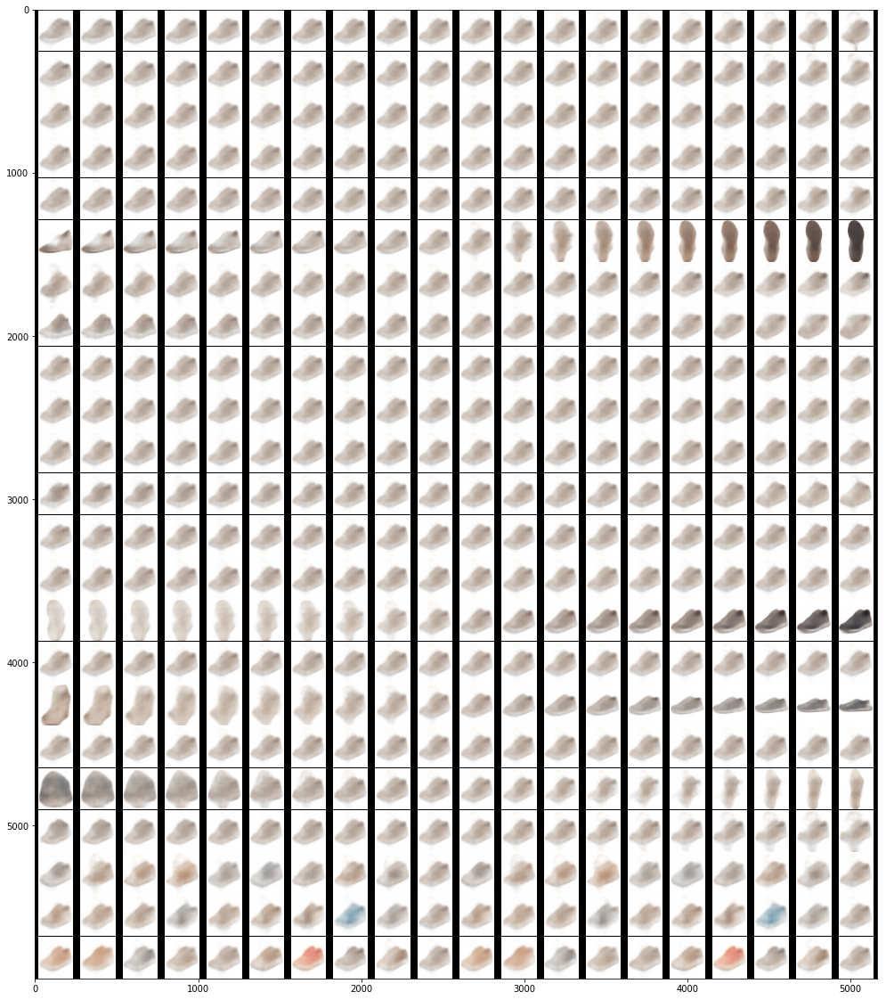

In [55]:
# Plot all traversals
traversals = viz.all_latent_traversals(size=20)

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_all_traversals_n20.png",dpi=200)

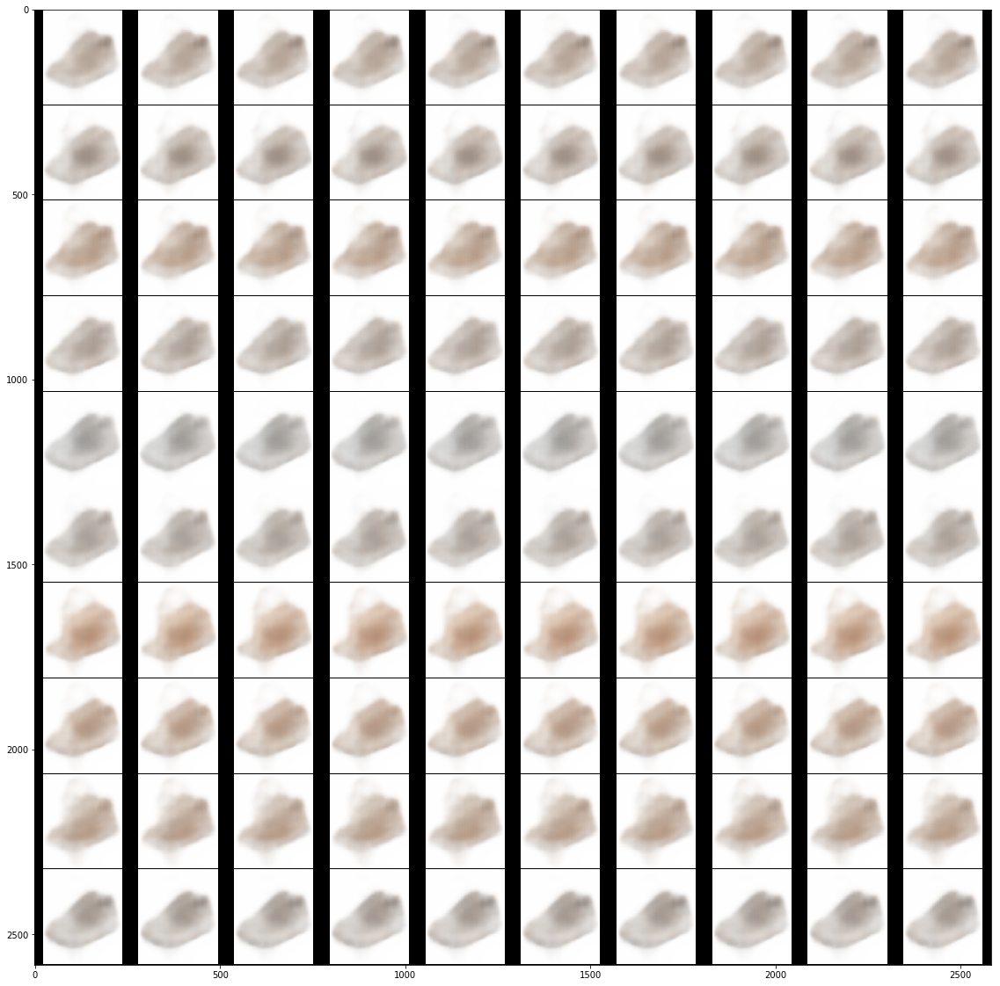

In [56]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=2, cont_axis=1, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals2100.png",dpi=200)

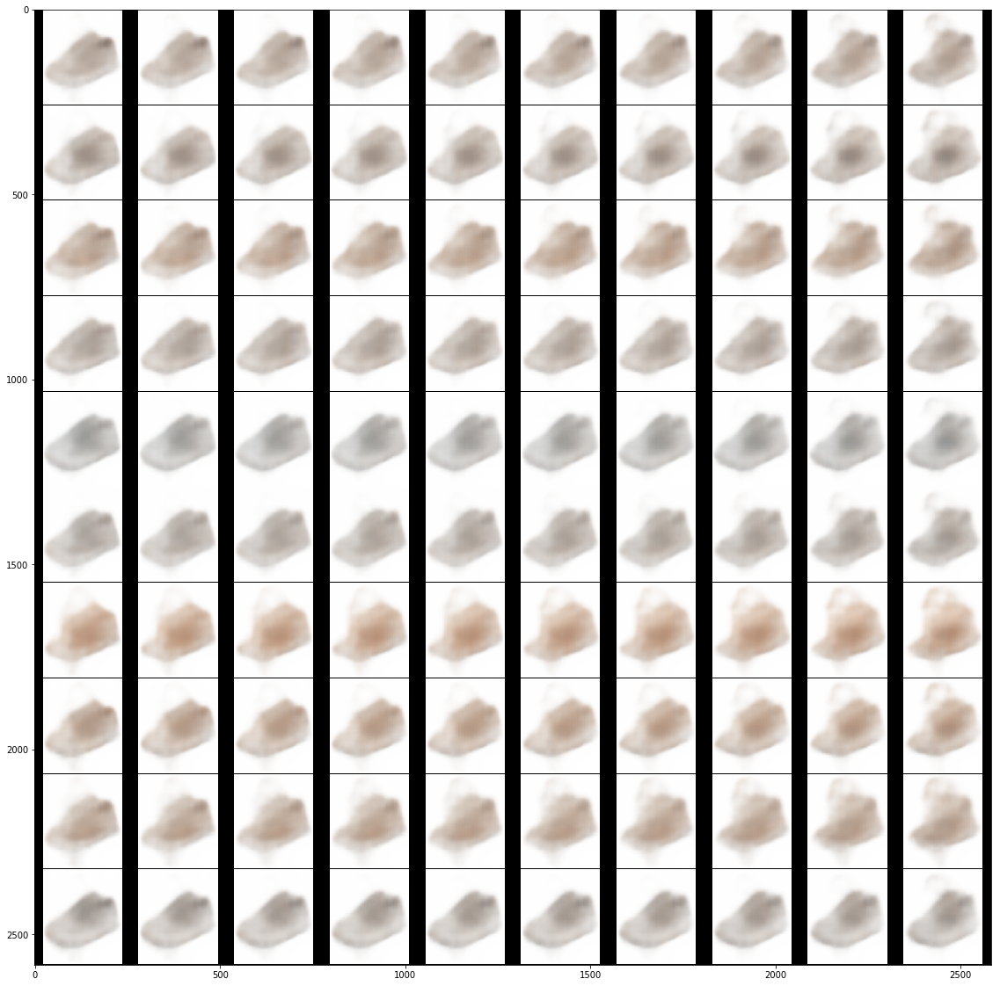

In [57]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=1, cont_axis=1, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(traversals.numpy()[0, :, :]);
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals1100.png",dpi=200)

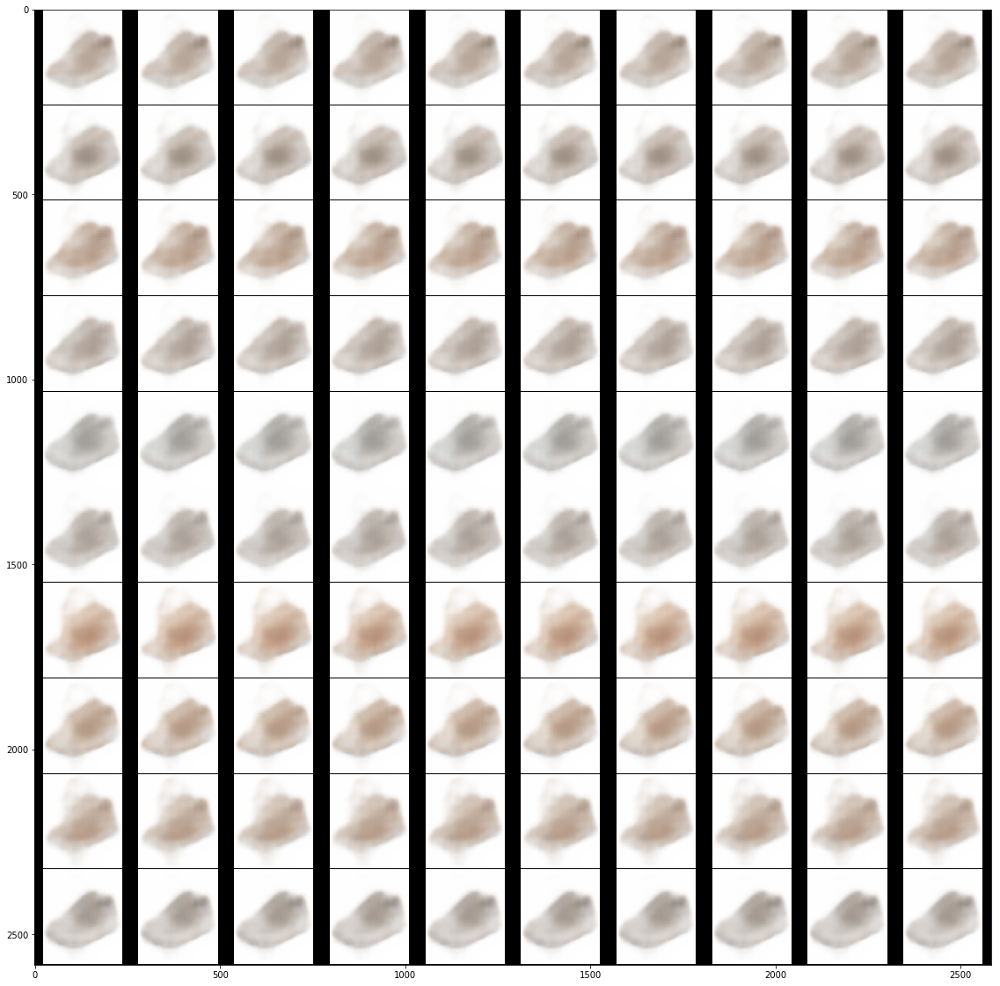

In [58]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=9, cont_axis=1, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals9100.png",dpi=200)

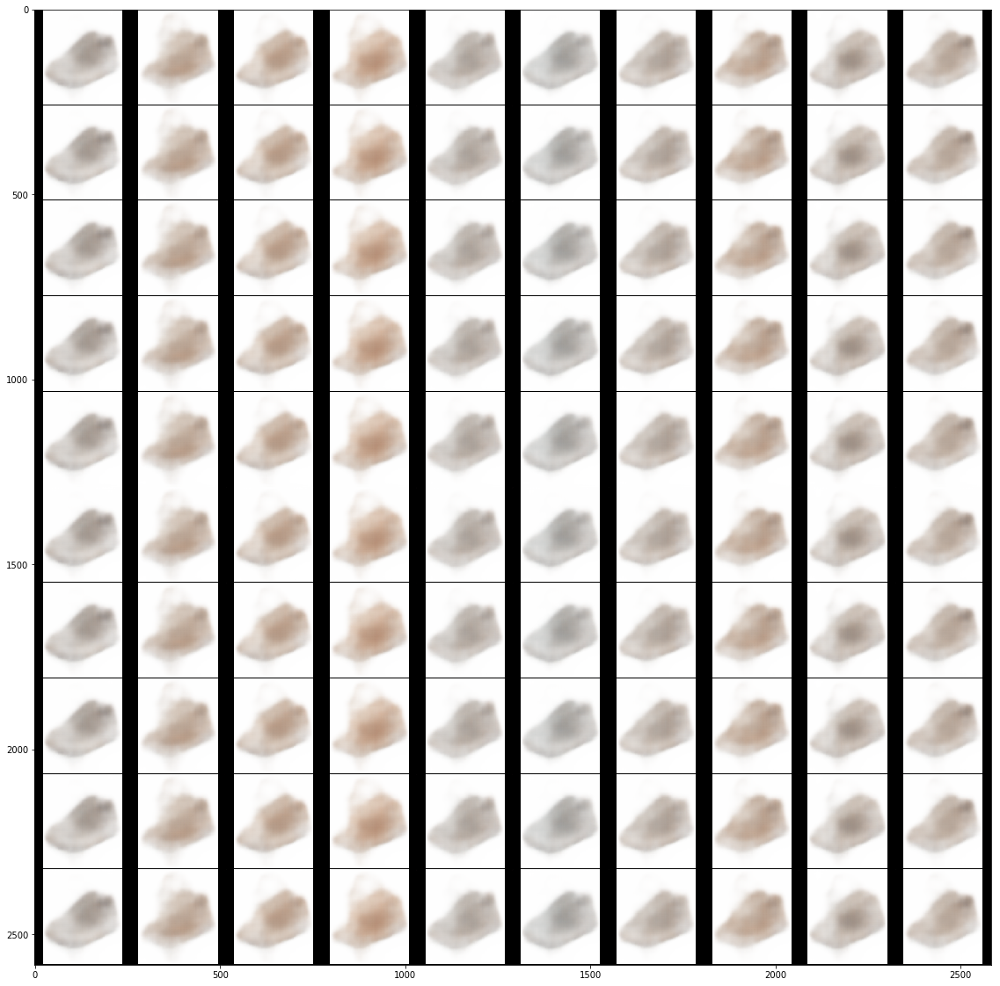

In [59]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=2, cont_axis=1, disc_idx=0, disc_axis=1, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals2101.png",dpi=200)

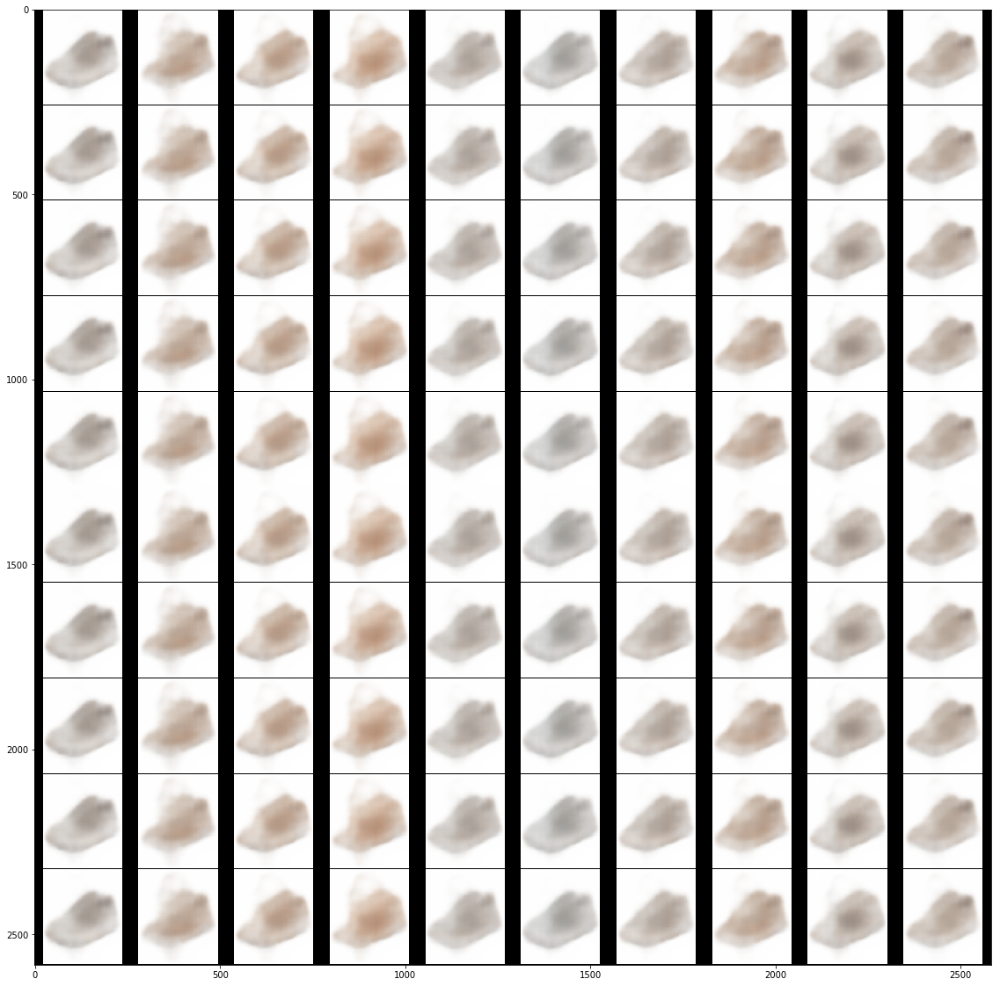

In [60]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=2, cont_axis=0, disc_idx=0, disc_axis=1, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals2001.png",dpi=200)

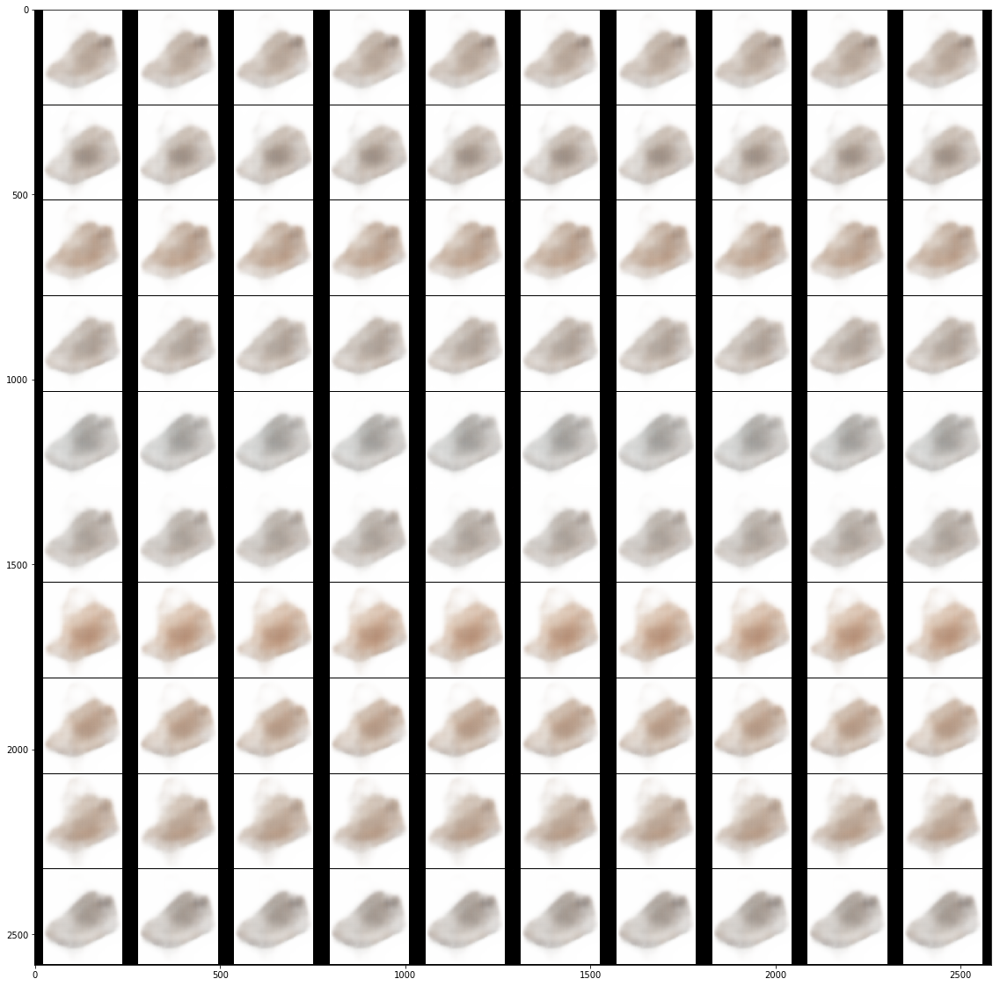

In [61]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=3, cont_axis=0, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals3000.png",dpi=200)

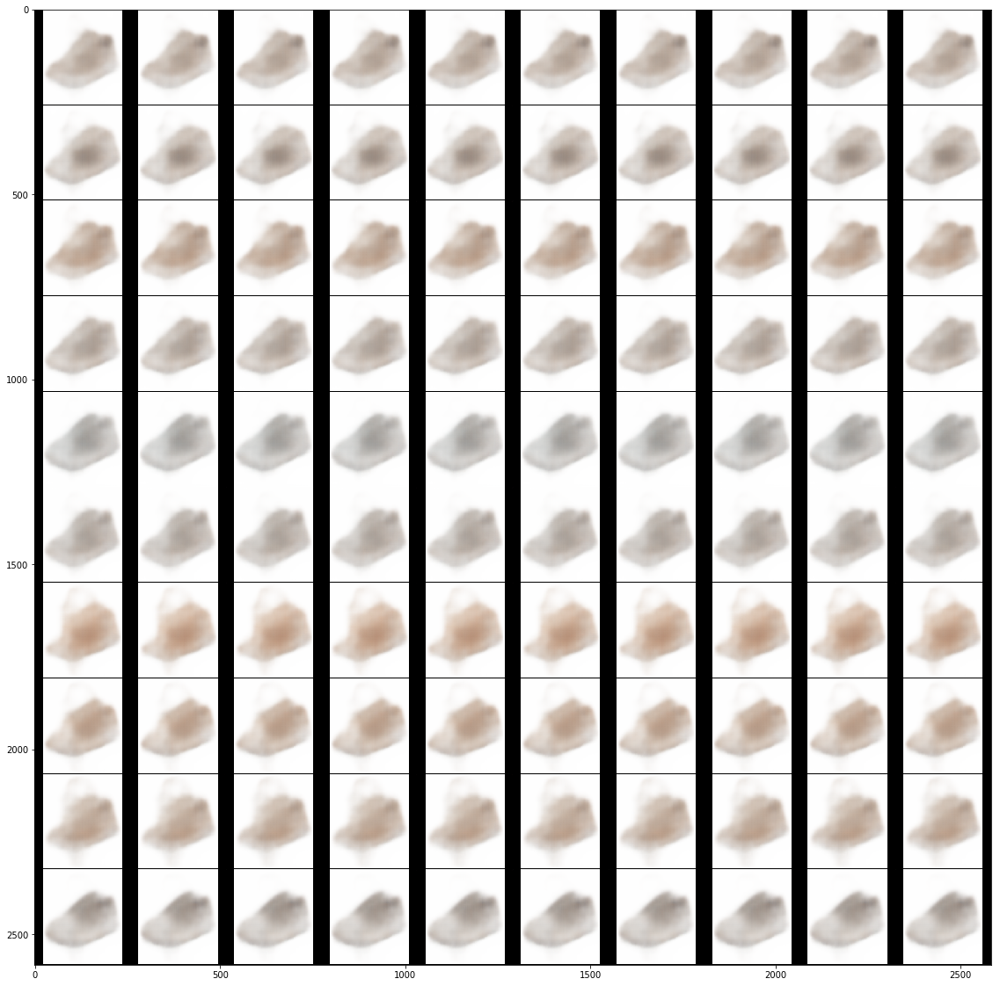

In [62]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=12, cont_axis=0, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig(save_image_path + model_name + "_traversals3000.png",dpi=200)

In [63]:
# Plot a grid of some traversals
traversals = viz2.latent_traversal_grid2(cont_idx=3, cont_axis=0, disc_idx=0, disc_axis=0, size=(20, 20),first_n=10)

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
#plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_traversals3000.png",dpi=200)

NameError: name 'viz2' is not defined

In [ ]:
!ls

### Save Model

In [ ]:
torch.save(model.state_dict(),"trained_models/" + "statedict_" + model_name) # save state dict
#torch.save(model, model_name) # save full model

In [ ]:
print("Done training: ",model_name)

#### Restore Model from State Dict

In [ ]:
sd_model = VAE(latent_spec=latent_spec, img_size=(3, 64, 64))
sd_model.load_state_dict(torch.load("statedict_" + model_name))

#### Restore Full Model
* Note in this case the serialized data is bound to the specific classes and exact directory strucutre used.

In [ ]:
full_model = torch.load(model_name)

In [ ]:
type(full_model)

In [ ]:
type(sd_model)

In [ ]:
!ls